# Imports

In [1]:
import time
import os
import pickle
import inspect
import numpy as np
from importlib import reload
from common import numerics as num
from common import numerical_recipes as numrec
from common.baseclasses import AWA
from common import plotting
from matplotlib import pyplot as plt

from BokehPlasmons import tip_modeling as TM
from BokehPlasmons.tip_modeling import utils
from BokehPlasmons.tip_modeling import eigpairs as ep
base_dir=os.path.dirname(os.path.dirname(inspect.getfile(TM)))
demo_dir=os.path.join(base_dir,'demos')
conductivites_dir=os.path.join(demo_dir,'conductivities')
eigenbases_dir=os.path.join(demo_dir,'eigenbases')

/Users/alexandersmcleod/opt/anaconda3/envs/SciComp/lib/python3.7/site-packages/pylab.py:1: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
  from matplotlib.pylab import *


<plotting>:
	Registered colormaps "Warm" and "Warm_r"...
<plotting>:
	Registered colormaps "vanheum" and "vanheum_r"...
<plotting>:
	Registered colormaps "NT-MDT" and "NT-MDT_r"...
<plotting>:
	Registered colormaps "rainbow" and "rainbow_r"...
<plotting>:
	Registered colormaps "jingdi" and "jingdi_r"...
<plotting>:
	Registered colormaps "Halcyon" and "Halcyon_r"...
<plotting>:
	Registered colormaps "Cold" and "Cold_r"...
<plotting>:
	Registered colormaps "Sky" and "Sky_r"...
<plotting>:
	Registered colormaps "Gwyddion.net" and "Gwyddion.net_r"...
<plotting>:
	Registered colormaps "BlueRed" and "BlueRed_r"...
<plotting>:
	Registered colormaps "vanheum3" and "vanheum3_r"...
<plotting>:
	Registered colormaps "vanheum2" and "vanheum2_r"...


# Inhomogeneous conductivity

## User-defined profile

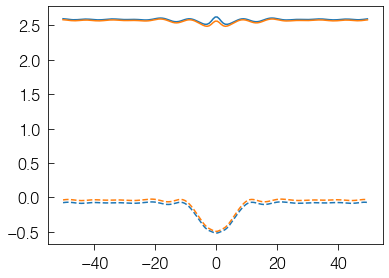

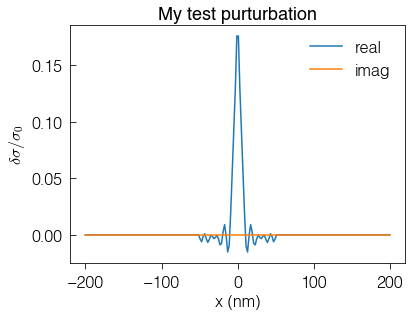

In [2]:
file_path=os.path.join(conductivites_dir,'DW_sigma_w1500mu0.006Vi0.002g0.25.txt')

xs,sigma_xx,sigma_yy=np.loadtxt(file_path,delimiter=',',dtype=complex).T
xs=xs.astype(float)
plt.plot(xs,sigma_xx.real); plt.plot(xs,sigma_xx.imag,color=plt.gca().lines[-1].get_color(),ls='--'); 
plt.plot(xs,sigma_yy.real); plt.plot(xs,sigma_yy.imag,color=plt.gca().lines[-1].get_color(),ls='--');

from scipy.interpolate import interp1d
mysigma=np.abs(sigma_xx-sigma_xx.imag).astype(float)
mysigma/=mysigma[0]
#xs_norm=((xs-xs.min())/(xs.max()-xs.min())).astype(float)
dsigma_norm=mysigma-1
interp=interp1d(xs,dsigma_norm,\
                bounds_error=False,fill_value=0)
dsigma_func=lambda x,y: interp(x)
dsigma_func_cmplx=lambda x,y: interp(x)+0j

xs_ev=np.linspace(-200,200,200)
plt.figure()
plt.title('My test purturbation')
plt.plot(xs_ev,dsigma_func_cmplx(xs_ev,0).real,label='real')
plt.plot(xs_ev,dsigma_func_cmplx(xs_ev,0).imag,label='imag')
plt.ylabel(r'$\delta \sigma / \sigma_0$')
plt.xlabel('x (nm)')
plt.legend()

# Build inhomogeneous eigenbasis

## Diagonalize total Laplacian operator: real-valued dsigma

Generating eigenpairs on x,y=[-600.0:+600.0:300],[-600.0:+600.0:300]
	Time elapsed: 1.718925952911377
Computing Laplacian...
	Time elapsed: 13.309600830078125
Building 928x928 matrix...
	Time elapsed: 1.584841012954712
sigma: float64
eigenvalues: float64


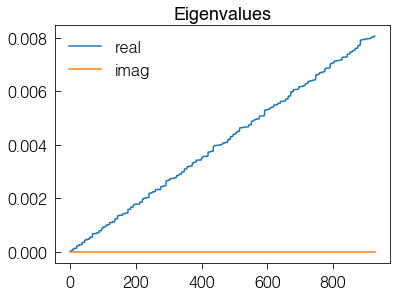

In [3]:
L=1200
Nx=300 #can resolve length scales as small as L/Nx
#Nqmax=2500
Nqmax=1000

reload(ep)
eigpairs=ep.build_inhomog_eigpairs(Lx=L,Nx=Nx,Ly=L,Nqmax=Nqmax,\
                                   dsigma=dsigma_func,multiprocess=False)

eigvals=np.array(list(eigpairs.keys()))
eigfuncs=list(eigpairs.values())

print('sigma:',dsigma_func(0,0).dtype)
print('eigenvalues:',eigvals.dtype)

plt.figure()
plt.plot(eigvals.real,label='real')
plt.plot(eigvals.imag,label='imag')
plt.title('Eigenvalues')
plt.legend()

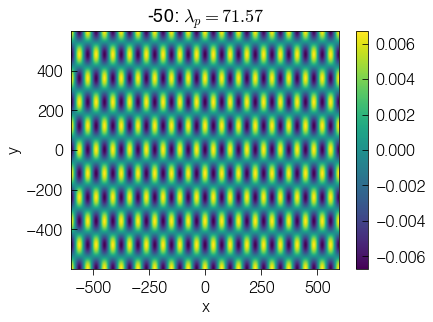

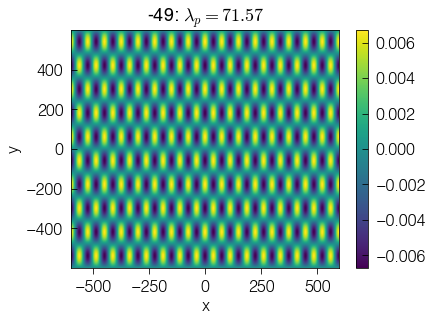

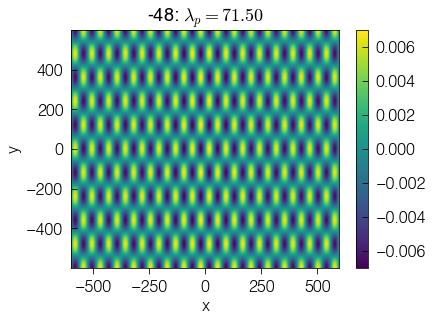

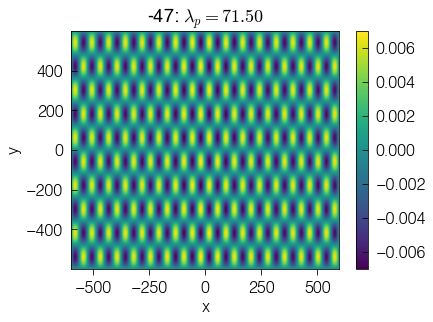

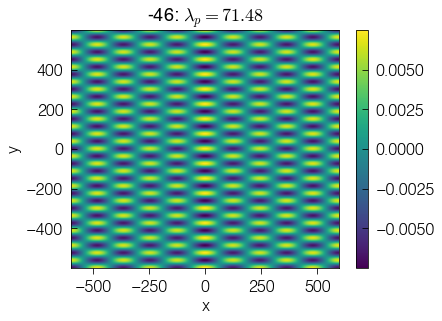

...

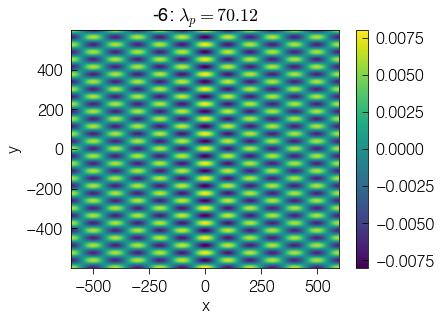

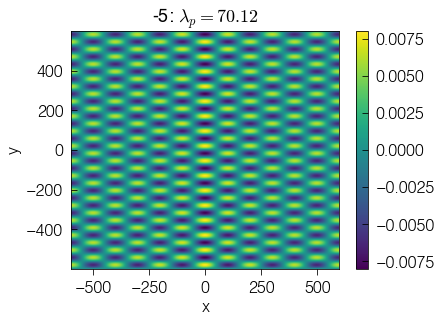

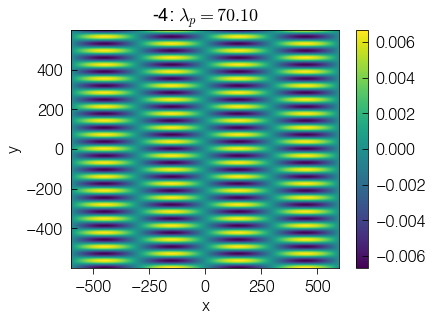

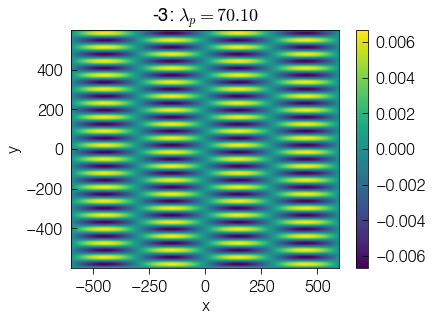

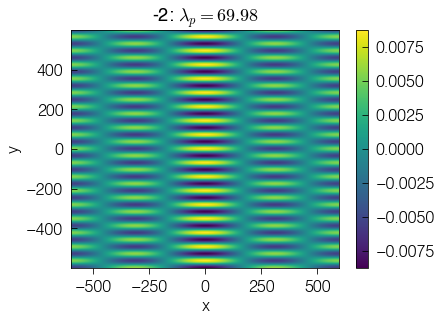

In [4]:
%matplotlib inline
nmin=-50
nmax=-1

eigvals=list(eigpairs.keys())
eigfuncs=list(eigpairs.values())

for n in range(nmin,nmax):
    eigfunc=eigfuncs[n]
    eigval=eigvals[n]
    plt.figure()
    eigfunc.plot()
    plt.title(r'%i: $\lambda_p=%1.2f$'%(n,2*np.pi/np.sqrt(eigval)))

## Diagonalize total Laplacian operator: complex-valued dsigma

Generating eigenpairs on x,y=[-600.0:+600.0:300],[-600.0:+600.0:300]
	Time elapsed: 1.4786098003387451
Computing Laplacian...
	Time elapsed: 15.86544680595398
Building 928x928 matrix...
	Time elapsed: 3.9930551052093506
Aligning phase of eigenvectors
0.9999999999999999 1.4901161193847656e-08 67108863.99999999
1.0 0.0 inf
0.9999999999999999 1.4901161193847656e-08 67108863.99999999
0.9999999999999999 0.0 inf
0.9999999999999998 0.0 inf
0.9999999999999997 1.4901161193847656e-08 67108863.99999998
1.0000000000000002 0.0 inf
1.0000000000000002 nan nan
0.9999999999999998 0.0 inf
1.0000000000000002 0.0 inf
1.0000000000000002 0.0 inf
1.0 0.0 inf
1.0000000000000002 0.0 inf
0.9999999999999998 0.0 inf
1.0 0.0 inf
0.9999999999999999 0.0 inf
1.0 0.0 inf
1.0 0.0 inf
1.0000000000000004 0.0 inf
0.9999999999999999 0.0 inf
0.9999999999999998 1.4901161193847656e-08 67108863.999999985
1.0 0.0 inf
0.9999999999999998 0.0 inf
1.0000000000000002 0.0 inf
0.9999999999999998 0.0 inf
1.0000000000000004 nan nan
1.00

0.9999999999999998 0.0 inf
0.9999999999999999 0.0 inf
0.9999999999999998 1.4901161193847656e-08 67108863.999999985
1.0000000000000004 nan nan
0.9999999999999999 0.0 inf
1.0 0.0 inf
1.0 0.0 inf
0.9999999999999998 0.0 inf
0.9999999999999999 nan nan
0.9999999999999998 1.4901161193847656e-08 67108863.999999985
0.9999999999999997 1.4901161193847656e-08 67108863.99999998
1.0 0.0 inf
0.9999999999999999 0.0 inf
1.0 0.0 inf
1.0000000000000002 0.0 inf
0.9999999999999998 nan nan
0.9999999999999996 0.0 inf
1.0000000000000004 0.0 inf
1.0 2.1073424255447017e-08 47453132.81212577
1.0 0.0 inf
1.0000000000000004 0.0 inf
0.9999999999999998 0.0 inf
0.9999999999999998 0.0 inf
1.0 0.0 inf
1.0 0.0 inf
1.0 0.0 inf
1.0 0.0 inf
0.9999999999999997 0.0 inf
1.0 0.0 inf
1.0000000000000002 0.0 inf
1.0000000000000002 0.0 inf
0.9999999999999994 0.0 inf
1.0 0.0 inf
0.9999999999999999 0.0 inf
1.0 0.0 inf
0.9999999999999999 0.0 inf
1.0 0.0 inf
0.9999999999999999 0.0 inf
1.0000000000000002 0.0 inf
0.9999999999999999 0.0 

1.0000000000000002 0.0 inf
1.0000000000000004 0.0 inf
1.0000000000000002 0.0 inf
1.0 0.0 inf
0.9999999999999996 0.0 inf
1.0000000000000002 nan nan
0.9999999999999999 1.4901161193847656e-08 67108863.99999999
0.9999999999999996 1.4901161193847656e-08 67108863.99999997
0.9999999999999996 1.4901161193847656e-08 67108863.99999997
1.0 0.0 inf
0.9999999999999999 0.0 inf
1.0000000000000002 2.1073424255447017e-08 47453132.81212579
1.0000000000000004 0.0 inf
0.9999999999999996 1.4901161193847656e-08 67108863.99999997
0.9999999999999998 0.0 inf
0.9999999999999999 0.0 inf
1.0000000000000002 0.0 inf
0.9999999999999997 0.0 inf
0.9999999999999996 0.0 inf
0.9999999999999999 0.0 inf
0.9999999999999999 0.0 inf
0.9999999999999998 0.0 inf
1.0000000000000002 0.0 inf
1.0000000000000002 0.0 inf
1.0 0.0 inf
0.9999999999999999 0.0 inf
1.0000000000000004 nan nan
0.9999999999999996 0.0 inf
1.0000000000000002 nan nan
0.9999999999999996 1.4901161193847656e-08 67108863.99999997
0.9999999999999999 0.0 inf
0.99999999

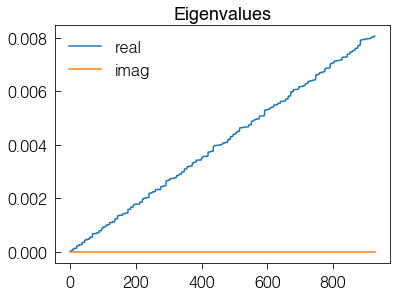

In [5]:
L=1200
Nx=300 #can resolve length scales as small as L/Nx
#Nqmax=2500
Nqmax=1000

reload(utils)
reload(ep)
eigpairs_cmplx=ep.build_inhomog_eigpairs(Lx=L,Nx=Nx,Ly=L,Nqmax=Nqmax,\
                                       dsigma=dsigma_func_cmplx,multiprocess=False)

eigvals_cmplx=np.array(list(eigpairs_cmplx.keys()))
eigfuncs_cmplx=list(eigpairs_cmplx.values())
print(dsigma_func_cmplx(0,0).dtype)
print(eigvals_cmplx.dtype)

plt.figure()
plt.plot(eigvals_cmplx.real,label='real')
plt.plot(eigvals_cmplx.imag,label='imag')
plt.title('Eigenvalues')
plt.legend()

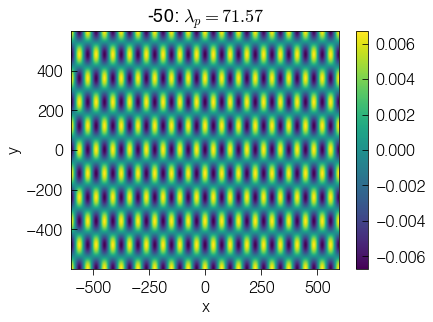

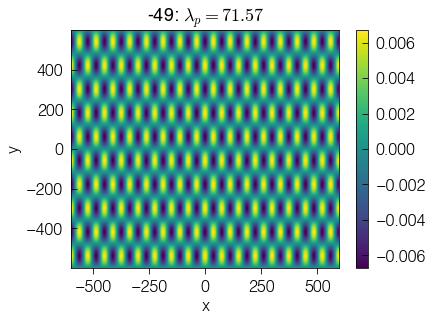

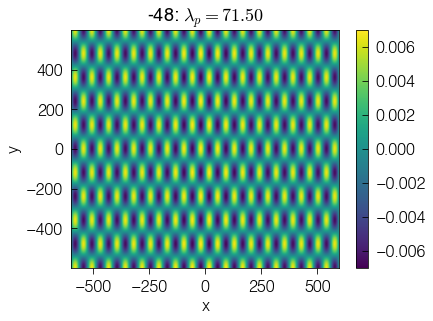

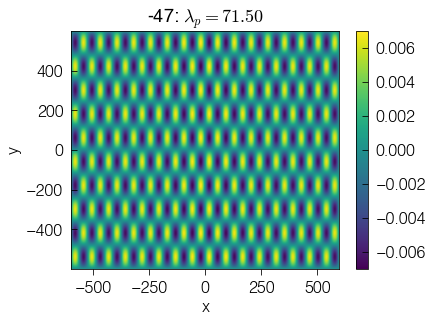

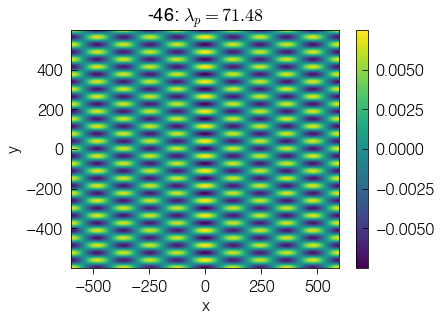

...

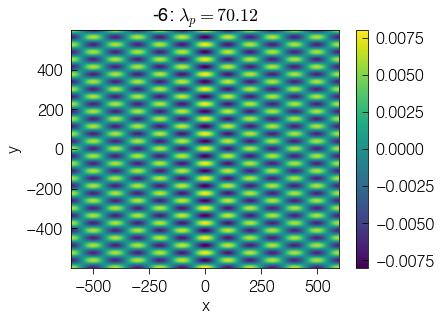

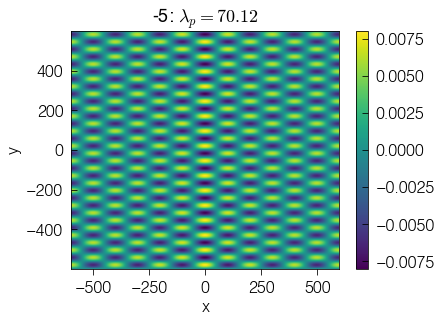

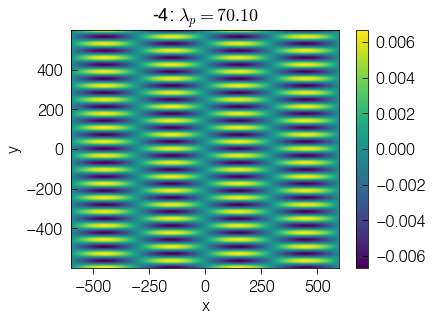

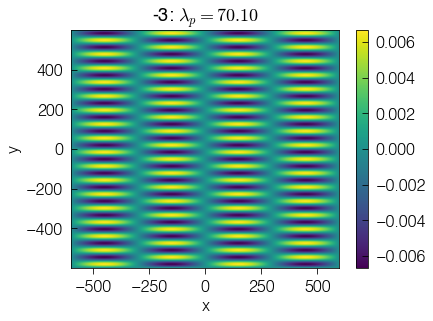

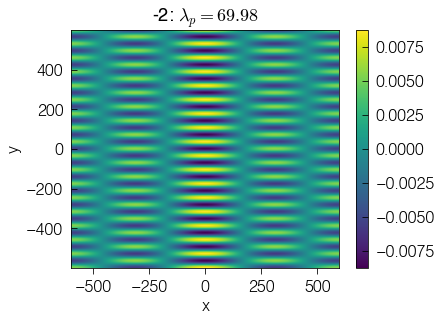

In [6]:
%matplotlib inline
nmin=-50
nmax=-1

for n in range(nmin,nmax):
    eigfunc=eigfuncs_cmplx[n]
    eigval=eigvals_cmplx[n]
    plt.figure()
    eigfunc.real.plot()
    plt.title(r'%i: $\lambda_p=%1.2f$'%(n,2*np.pi/np.sqrt(eigval)))

# Build sample response with new eigpairs

## Perform linescans: real sigma

In [7]:
reload(utils)
reload(TM)

#Use the generated eigpairs
# With 'periodic' Coulomb, calculation is fast enough to not require multiprocessing
SR=TM.SampleResponse(eigpairs,qp=0,Qfactor=10,N=2500,\
                     coulomb_shortcut=False,coulomb_bc='periodic',\
                     coulomb_multiprocess=False)

#Just our fake tip
tipsize=100
TR=TM.TipResponse(SR.xs,SR.ys,\
                      q=2*np.pi/tipsize,\
                      N_tip_eigenbasis=1,\
                  periodic=True)

Setting Eigenbasis...
	Time elapsed: 1.6341009140014648
Tuning Eigenbasis...
	Time elapsed: 1.4337773323059082
Applying Coulomb kernel...
Building 928x928 matrix...
	Time elapsed: 1.67691969871521
	Time elapsed: 5.609872102737427
Computing Reflection Matrix...
	Time elapsed: 0.12805485725402832


In [8]:
def perform_linescans(SR,TR,\
                      xs=None,\
                      lp_min=40,lp_max=400,Nlps=20,\
                       Qfactor=10):
    """
    Perform `Nlps` linescans across the sample while varying
    plasmon wavelength from `lp_min` to `lp_max`.
    """

    SR._set_alpha(Qfactor)
    lps=np.linspace(lp_min,lp_max,Nlps)
    if xs is None: xs=SR.xs

    rasters=[]
    for i,lp in enumerate(lps):
        qp=2*np.pi/lp
        SR._set_reflection_matrix(qp)
        rasters.append(SR.raster_scan(TR,xs=xs,ys=0)['R']) #Return reflectance
        print('PROGRESS: %1.1f%% done'%((i+1)/len(lps)*100))
        
    return AWA(rasters,axes=[lps]+rasters[0].axes,\
               axis_names=[r'$\lambda_p$ (nm)','$x$ (nm)'])

#xs=np.linspace(-L/2,L/2,int(L/30))
dx=np.diff(SR.xs)[0]
xs=np.linspace(-L/2,L/2,int(L/dx/2))
linescans=perform_linescans(SR,TR,xs=xs,\
                            lp_min=40,lp_max=400,Nlps=20,Qfactor=2*np.pi)

#Somehow the baseline shifts up and down, correct it
# probably due to periodic boundaries in small simulation cell
for linescan in linescans:
    linescan/=np.mean(linescan)

Computing Reflection Matrix...
	Time elapsed: 0.1239778995513916
Raster scanning tip...
	10% complete...
	20% complete...
	30% complete...
	40% complete...
	50% complete...
	60% complete...
	70% complete...
	80% complete...
	90% complete...
	Time elapsed: 10.797644138336182
PROGRESS: 5.0% done
Computing Reflection Matrix...
	Time elapsed: 0.12746214866638184
Raster scanning tip...
	10% complete...
	20% complete...
	30% complete...
	40% complete...
	50% complete...
	60% complete...
	70% complete...
	80% complete...
	90% complete...
	Time elapsed: 10.99335503578186
PROGRESS: 10.0% done
Computing Reflection Matrix...
	Time elapsed: 0.13973093032836914
Raster scanning tip...
	10% complete...
	20% complete...
	30% complete...
	40% complete...
	50% complete...
	60% complete...
	70% complete...
	80% complete...
	90% complete...
	Time elapsed: 11.039384841918945
PROGRESS: 15.0% done
Computing Reflection Matrix...
	Time elapsed: 0.12736797332763672
Raster scanning tip...
	10% complete...
	20% c

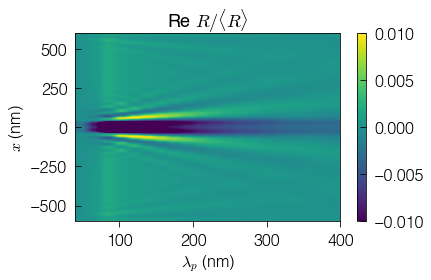

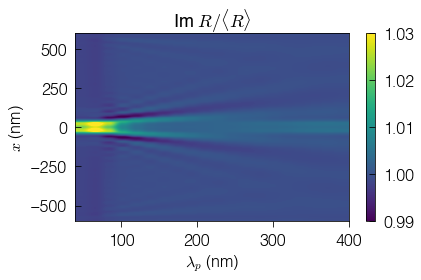

In [9]:
plt.figure()
plt.title(r'Re $R / \langle R \rangle$')
linescans.imag.plot()
plt.tight_layout()
plt.clim(-.01,.01)

plt.figure()
plt.title(r'Im $R / \langle R \rangle$')
linescans.real.plot()
plt.tight_layout()
plt.clim(.99,1.03)


In [10]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

plt.figure()
def plot_linescan(lambda_p):
    plt.clf()
    linescans.real.cslice[lambda_p].plot(color='r')
    plt.twinx();linescans.imag.cslice[lambda_p].plot(color='b')
    
l=interact(plot_linescan, lambda_p=(40,400));
l

<Figure size 432x288 with 0 Axes>

interactive(children=(IntSlider(value=220, description='lambda_p', max=400, min=40), Output()), _dom_classes=(…

<function __main__.plot_linescan(lambda_p)>

## Perform linescans: complex sigma

In [11]:
reload(utils)
reload(TM)

#Use the generated eigpairs
# With 'periodic' Coulomb, calculation is fast enough to not require multiprocessing
SR_cmplx=TM.SampleResponse(eigpairs_cmplx,qp=0,Qfactor=10,N=2500,\
                         coulomb_shortcut=False,coulomb_bc='periodic',\
                         coulomb_multiprocess=False)

#Just our fake tip
tipsize=100
TR_cmplx=TM.TipResponse(SR_cmplx.xs,SR_cmplx.ys,\
                      q=2*np.pi/tipsize,\
                      N_tip_eigenbasis=1,\
                      periodic=True)

Setting Eigenbasis...
	Time elapsed: 2.6742050647735596
Tuning Eigenbasis...
	Time elapsed: 1.631748914718628
Applying Coulomb kernel...
Building 928x928 matrix...
	Time elapsed: 4.410887956619263
	Time elapsed: 8.468730926513672
Computing Reflection Matrix...
	Time elapsed: 0.14474821090698242


In [12]:
def perform_linescans(SR,TR,\
                      xs=None,\
                      lp_min=40,lp_max=400,Nlps=20,\
                       Qfactor=10):
    """
    Perform `Nlps` linescans across the sample while varying
    plasmon wavelength from `lp_min` to `lp_max`.
    """

    SR._set_alpha(Qfactor)
    lps=np.linspace(lp_min,lp_max,Nlps)
    if xs is None: xs=SR.xs

    rasters=[]
    for i,lp in enumerate(lps):
        qp=2*np.pi/lp
        SR._set_reflection_matrix(qp)
        rasters.append(SR.raster_scan(TR,xs=xs,ys=0)['R']) #Return reflectance
        print('PROGRESS: %1.1f%% done'%((i+1)/len(lps)*100))
        
    return AWA(rasters,axes=[lps]+rasters[0].axes,\
               axis_names=[r'$\lambda_p$ (nm)','$x$ (nm)'])

#xs=np.linspace(-L/2,L/2,int(L/30))
dx=np.diff(SR.xs)[0]
xs=np.linspace(-L/2,L/2,int(L/dx/2))
linescans_cmplx=perform_linescans(SR_cmplx,TR_cmplx,xs=xs,\
                            lp_min=40,lp_max=400,Nlps=20,Qfactor=2*np.pi)

#Somehow the baseline shifts up and down, correct it
# probably due to periodic boundaries in small simulation cell
for linescan in linescans_cmplx:
    linescan/=np.mean(linescan)

Computing Reflection Matrix...
	Time elapsed: 0.12320899963378906
Raster scanning tip...
	10% complete...
	20% complete...
	30% complete...
	40% complete...
	50% complete...
	60% complete...
	70% complete...
	80% complete...
	90% complete...
	Time elapsed: 11.502686977386475
PROGRESS: 5.0% done
Computing Reflection Matrix...
	Time elapsed: 0.1496748924255371
Raster scanning tip...
	10% complete...
	20% complete...
	30% complete...
	40% complete...
	50% complete...
	60% complete...
	70% complete...
	80% complete...
	90% complete...
	Time elapsed: 11.375976085662842
PROGRESS: 10.0% done
Computing Reflection Matrix...
	Time elapsed: 0.13474130630493164
Raster scanning tip...
	10% complete...
	20% complete...
	30% complete...
	40% complete...
	50% complete...
	60% complete...
	70% complete...
	80% complete...
	90% complete...
	Time elapsed: 11.37885594367981
PROGRESS: 15.0% done
Computing Reflection Matrix...
	Time elapsed: 0.1367478370666504
Raster scanning tip...
	10% complete...
	20% co

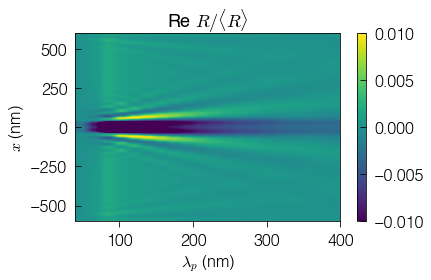

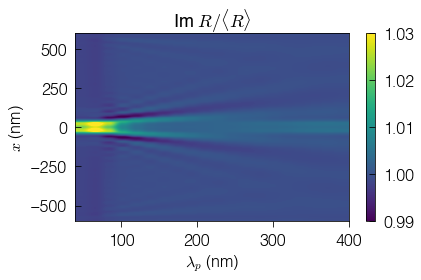

In [13]:
plt.figure()
plt.title(r'Re $R / \langle R \rangle$')
linescans_cmplx.imag.plot()
plt.tight_layout()
plt.clim(-.01,.01)

plt.figure()
plt.title(r'Im $R / \langle R \rangle$')
linescans_cmplx.real.plot()
plt.tight_layout()
plt.clim(.99,1.03)


In [28]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

plt.figure()
def plot_linescan(lambda_p):
    plt.clf()
    linescans_cmplx.real.cslice[lambda_p].plot(color='r')
    plt.twinx();linescans_cmplx.imag.cslice[lambda_p].plot(color='b')
    
l=interact(plot_linescan, lambda_p=(40,400));
l

<Figure size 432x288 with 0 Axes>

interactive(children=(IntSlider(value=220, description='lambda_p', max=400, min=40), Output()), _dom_classes=(…

<function __main__.plot_linescan(lambda_p)>

## Compare innards of real-valued and complex-valued sample response

Computing Reflection Matrix...
	Time elapsed: 0.12839508056640625
Computing Reflection Matrix...
	Time elapsed: 0.13002395629882812


Text(0.5, 0, 'q')

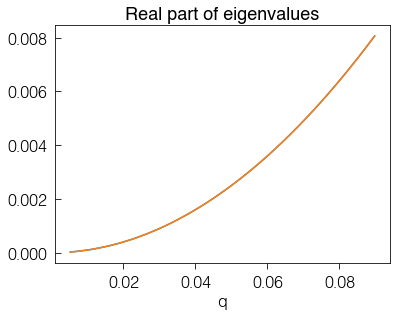

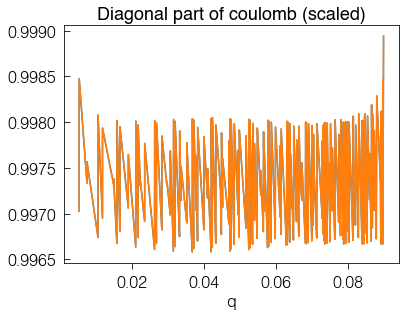

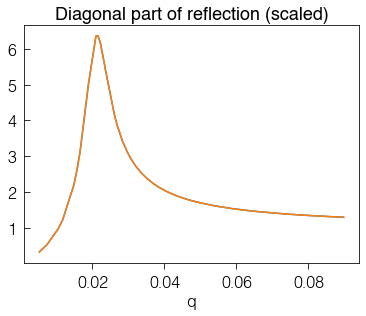

In [27]:
%matplotlib inline
lp=300
SR._set_reflection_matrix(qp=2*np.pi/lp)
SR_cmplx._set_reflection_matrix(qp=2*np.pi/lp)
qs=np.sqrt(SR.use_eigvals)

plt.figure()
plt.plot(qs,SR.use_eigvals.real)
plt.plot(qs,SR_cmplx.use_eigvals.real)
plt.title('Real part of eigenvalues')
plt.xlabel('q')

plt.figure()
plt.plot(qs,np.diag(np.abs(SR.V_mn))*qs/(2*np.pi))
plt.plot(qs,np.diag(np.abs(SR_cmplx.V_mn))*qs/(2*np.pi))
plt.title('Diagonal part of coulomb (scaled)')
plt.xlabel('q')

plt.figure()
plt.plot(qs,np.diag(np.abs(SR.R_mn))*2*np.pi/qs)
plt.plot(qs,np.diag(np.abs(SR_cmplx.R_mn))*2*np.pi/qs)
plt.title('Diagonal part of reflection (scaled)')
plt.xlabel('q')

# What if we now tune up the perturbation strength?

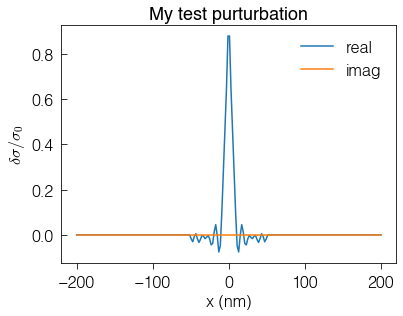

In [29]:
strong_dsigma_func=lambda x,y: dsigma_func(x,y)*5

xs_ev=np.linspace(-200,200,200)
plt.figure()
plt.title('My test purturbation')
plt.plot(xs_ev,strong_dsigma_func(xs_ev,0).real,label='real')
plt.plot(xs_ev,strong_dsigma_func(xs_ev,0).imag,label='imag')
plt.ylabel(r'$\delta \sigma / \sigma_0$')
plt.xlabel('x (nm)')
plt.legend()

Generating eigenpairs on x,y=[-600.0:+600.0:300],[-600.0:+600.0:300]
	Time elapsed: 1.610875129699707
Computing Laplacian...
	Time elapsed: 23.82730484008789
Building 928x928 matrix...
	Time elapsed: 2.042133092880249
Setting Eigenbasis...
	Time elapsed: 1.8845508098602295
Tuning Eigenbasis...
	Time elapsed: 1.3557159900665283
Applying Coulomb kernel...
Building 928x928 matrix...
	Time elapsed: 1.6335079669952393
	Time elapsed: 5.624629974365234
Computing Reflection Matrix...
	Time elapsed: 0.14514517784118652


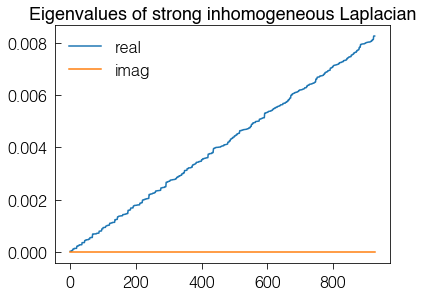

In [30]:
L=1200
Nx=300 #can resolve length scales as small as L/Nx
#Nqmax=2500
Nqmax=1000

reload(utils)
reload(ep)
eigpairs_strong=ep.build_inhomog_eigpairs(Lx=L,Nx=Nx,Ly=L,Nqmax=Nqmax,\
                                   dsigma=strong_dsigma_func,multiprocess=False)
eigvals_strong=np.array(list(eigpairs_strong.keys()))
eigfuncs_strong=list(eigpairs_strong.values())
plt.figure()
plt.plot(eigvals_strong.real,label='real')
plt.plot(eigvals_strong.imag,label='imag')
plt.legend()
plt.title('Eigenvalues of strong inhomogeneous Laplacian')

reload(TM)
#Use the generated eigpairs
# With 'periodic' Coulomb, calculation is fast enough to not require multiprocessing
SR_strong=TM.SampleResponse(eigpairs_strong,qp=0,Qfactor=10,N=2500,\
                     coulomb_shortcut=False,coulomb_bc='periodic',\
                     coulomb_multiprocess=False)

#Just our fake tip
tipsize=100
TR_strong=TM.TipResponse(SR_strong.xs,SR_strong.ys,\
                          q=2*np.pi/tipsize,\
                          N_tip_eigenbasis=1,\
                          periodic=True)

Computing Reflection Matrix...
	Time elapsed: 0.11327719688415527


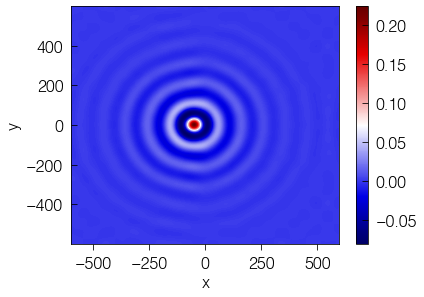

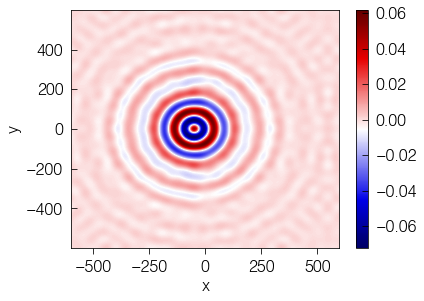

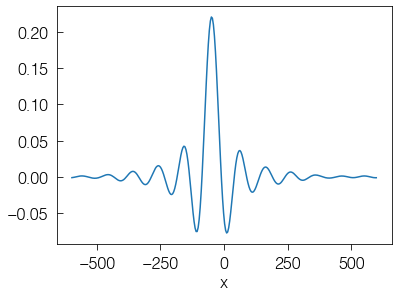

In [31]:
lp=tipsize
SR_strong._set_reflection_matrix(qp=2*np.pi/lp)
exc=TR_strong(-50,0)[0]
resp=SR_strong(exc)

plt.figure();resp.imag.plot(cmap='BWR2')
plt.figure();resp.real.plot(cmap='BWR2')
plt.figure();resp.imag.cslice[:,0].plot()

In [32]:
#xs=np.linspace(-L/2,L/2,int(L/30))
dx=np.diff(SR.xs)[0]
xs=np.linspace(-L/2,L/2,int(L/dx/2))
linescans_strong=perform_linescans(SR_strong,TR_strong,xs=xs,\
                            lp_min=40,lp_max=400,Nlps=10,Qfactor=2*np.pi)

#Somehow the baseline shifts up and down, correct it
# probably due to periodic boundaries in small simulation cell
for linescan in linescans_strong:
    linescan/=np.mean(linescan)

Computing Reflection Matrix...
	Time elapsed: 0.12535309791564941
Raster scanning tip...
	10% complete...
	20% complete...
	30% complete...
	40% complete...
	50% complete...
	60% complete...
	70% complete...
	80% complete...
	90% complete...
	Time elapsed: 10.812119007110596
PROGRESS: 10.0% done
Computing Reflection Matrix...
	Time elapsed: 0.12265920639038086
Raster scanning tip...
	10% complete...
	20% complete...
	30% complete...
	40% complete...
	50% complete...
	60% complete...
	70% complete...
	80% complete...
	90% complete...
	Time elapsed: 10.913810968399048
PROGRESS: 20.0% done
Computing Reflection Matrix...
	Time elapsed: 0.14407992362976074
Raster scanning tip...
	10% complete...
	20% complete...
	30% complete...
	40% complete...
	50% complete...
	60% complete...
	70% complete...
	80% complete...
	90% complete...
	Time elapsed: 10.958772897720337
PROGRESS: 30.0% done
Computing Reflection Matrix...
	Time elapsed: 0.13981389999389648
Raster scanning tip...
	10% complete...
	20

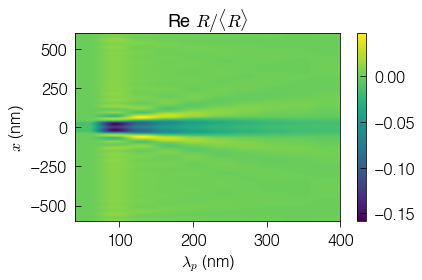

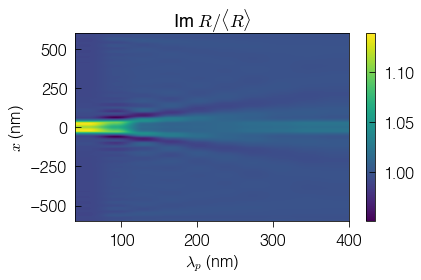

In [33]:
plt.figure()
plt.title(r'Re $R / \langle R \rangle$')
linescans_strong.imag.plot()
plt.tight_layout()
#plt.clim(-.05,.03)

plt.figure()
plt.title(r'Im $R / \langle R \rangle$')
linescans_strong.real.plot()
plt.tight_layout()
#plt.clim(.99,1.03)

In [34]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

plt.figure()
def plot_linescan(lambda_p):
    plt.clf()
    linescans_strong.real.cslice[lambda_p].plot(color='r')
    plt.twinx()
    linescans_strong.imag.cslice[lambda_p].plot(color='b')
    
l=interact(plot_linescan, lambda_p=(20,300));
l

<Figure size 432x288 with 0 Axes>

interactive(children=(IntSlider(value=160, description='lambda_p', max=300, min=20), Output()), _dom_classes=(…

<function __main__.plot_linescan(lambda_p)>